## Side-by-side OCR in Python with Tesseract and Google Vision

In [2]:
%matplotlib inline

In [3]:
import cv2
from pytrends.request import TrendReq
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import pandas as pd
import numpy as np
import pytesseract as pt
from pytesseract import Output
from shapely.geometry import Polygon
from demo_class import DemoOCR

In [26]:
pt.pytesseract.tesseract_cmd = 'C:/Program Files/Tesseract-OCR/tesseract.exe'
GGL_CRED = 'credentials/ocr_test.json'

### Modern OCR systems

OCR (Optical Character Recognition) systems are there to transform an image that contains valuable information (presumably in text format) into machine-readable data. In most cases, performing OCR through some available means is the initial step for [data extraction](https://towardsdatascience.com/data-extraction-from-a-pdf-table-with-semi-structured-layout-ef694f3f8ff1) from paper or scan-based PDF documents.

Whereas after a short search on the web you can come up with plenty of links to various open-source and commercial tools, [Google Vision](https://cloud.google.com/vision) and [Tesseract](https://tesseract-ocr.github.io/) as OCR engines have got a long start over their competitors, especially in recent years.

Tesseract is offline and open-source text recognition engine with a fully-featured API that can be easily implemented into any business project via some wrapper modules for Python, [pytesseract](https://pypi.org/project/pytesseract/) is one example.

On the contrary, Google Vision does not run locally, but rather on remote Google's servers. To start using Google Vision API in your project, you have to make some setup steps including the provision of valid credentials according to the [official guide](https://cloud.google.com/vision/docs/setup). Moreover, you can be charged for above-free-limit text recognition requests as stated in [Google’s pricing policy](https://cloud.google.com/vision/pricing).  

Despite fundamental differences in terms of usage and set of options to run with both tools are of virtually the same interest to web users judging by Google Trends:

In [11]:
pytrend = TrendReq()
kw_list = ['google vision', 'tesseract']
pytrend.build_payload(kw_list, timeframe='today 12-m')
ocr_trends = pytrend.interest_over_time()

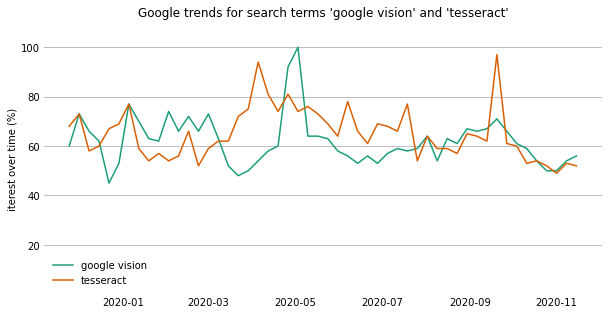

In [12]:
hex_colors = ['#1b9e77', '#d95f02']

fig, ax = plt.subplots(1, figsize=(10, 5))
ax.spines['top'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.tick_params(axis='both', which='both', length=0)
ax.axes.yaxis.get_major_ticks()[0].label1.set_visible(False)
ax.axes.set_ylim((0, 110))
ax.set(ylabel='iterest over time (%)')
ax.yaxis.grid()
(ax
 .title
 .set_text("Google trends for search terms 'google vision' and 'tesseract'"))
ax.plot(ocr_trends['google vision'], color=hex_colors[0], label=kw_list[0])
ax.plot(ocr_trends['tesseract'], color=hex_colors[1], label=kw_list[1])
ax.legend(loc='lower left', frameon=False)

Moving forward we will try to perform OCR in Python with both engines incidentally comparing their performance on real-life images.

### Method for OCR comparison: an overview

To achieve as comparable as possible results we will execute a ‘reversal’ approach. It means that we will initially perform OCR on a text image without any preprocessing onwards trying to machine-read chars from the same image repeatedly applying different degrading filters to it. On each step, we will assess the OCR performance as a fraction of properly read chars compared to their number successfully (and equally) read by both tools on the initial step.

In [9]:
FILE = 'demo_img/demo1.jpg'

with open(FILE, 'rb') as img_obj:
    img_bytes = img_obj.read()

In [27]:
demo1 = DemoOCR(GGL_CRED, img_bytes)

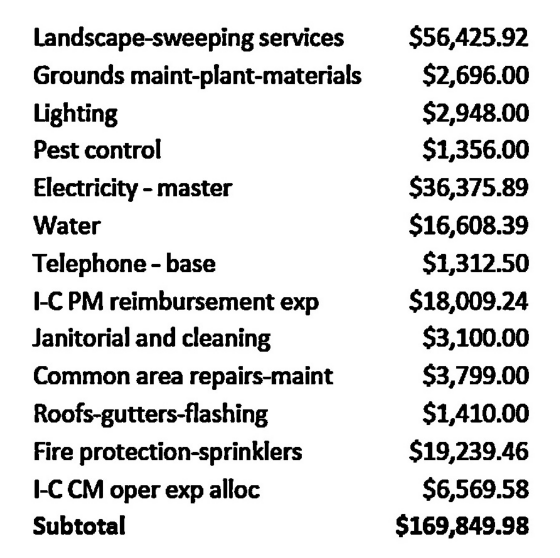

In [15]:
plt.figure(figsize=(10, 10))
plt.axis('off')
plt.imshow(demo1.bytes_to_image(img_bytes)[0])

But as a starting point, we are going to taste some quirks of OCR in Python with Tesseract and Google Vision.

### Tesseract: joins what you might expect to be splitted

Things might look quite natural when you apply Tesseract’s image_to_data method to images of adequate quality (i.e. hard and sharp enough). But with blurred images, this tool seems to have a relish for improper determination of text bounding boxes. That’s what exactly happens:  

In [17]:
def get_tes_data(image_bytes):
    tes_rw = pt.image_to_data(demo1.bytes_to_image(image_bytes)[0],
                              output_type=Output.DICT)
    tes_df = pd.DataFrame.from_dict(tes_rw)
    tes_df['text'] = tes_df['text'].replace(r'^\s+$', '', regex=True)
    tes_fl = (tes_df[(tes_df['text'].astype(bool)) &
                     (tes_df['conf'] != 0)])
    tes_fl = tes_fl.apply(demo1.expand_coordinates, axis=1)
    tes_gm = tes_fl.apply(demo1.fit_to_poly, axis=1).reset_index(drop=True)
    return tes_gm

In [18]:
blurred = cv2.GaussianBlur(demo1.bytes_to_image(img_bytes)[0], (13, 13), 0)
blurred_bytes = cv2.imencode('.png', blurred)[1].tobytes()

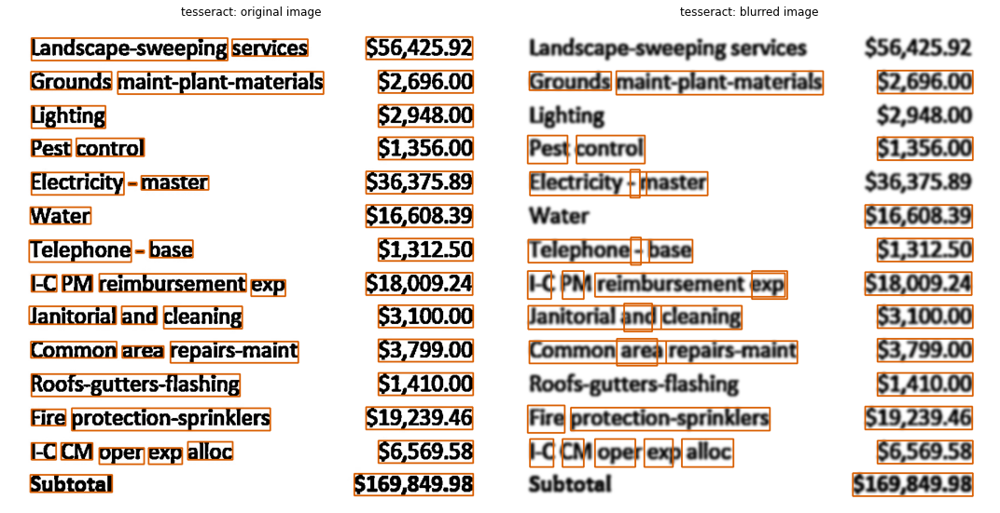

In [20]:
fig, ax = plt.subplots(1, 2, figsize=(15, 10))
titles = ['tesseract: original image', 'tesseract: blurred image']
images = [img_bytes, blurred_bytes]
for i in range(2):
    view = demo1.draw_rects(get_tes_data(images[i]), images[i], (217, 95, 2))
    ax[i].axis("off")
    ax[i].set_adjustable("box")
    ax[i].title.set_text(titles[i])
    ax[i].imshow(view)
fig.tight_layout()

And more specifically (note how some bounding boxes overlap each other):

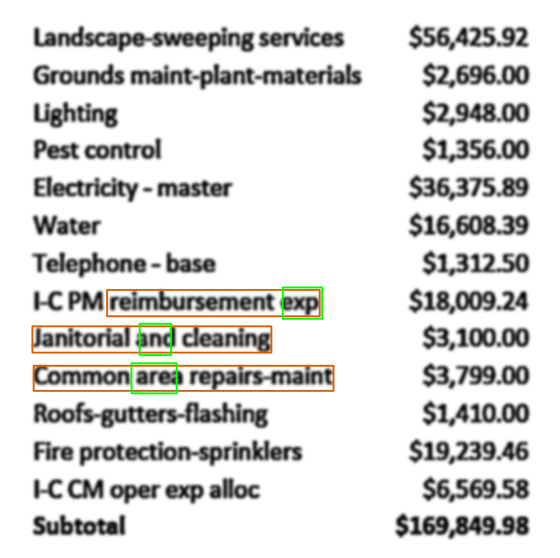

In [21]:
tes_data_bl = get_tes_data(images[1])
view1 = demo1.draw_rects(tes_data_bl.loc[[12, 14, 17]],
                         blurred_bytes,
                         (217, 95, 2))
view1_bytes = cv2.imencode('.png', view1)[1].tobytes()
view2 = demo1.draw_rects(tes_data_bl.loc[[13, 15, 18]],
                         view1_bytes,
                         (0, 255, 0))

plt.figure(figsize=(10, 10))
plt.axis('off')
plt.imshow(view2)

To retrieve such an odd behaviour we have to manually iterate over the bounding boxes, find those with significant horizontal intersection areas, and correct their right boundaries. In an overwhelming majority of cases, it will make the width of the bounding box to precisely match the length of the contained string. This algorithm is already incorporated in get_tes_ocr_data method from DemoOCR class and allow us to get adjusted data at each step of performing OCR to a modified image.

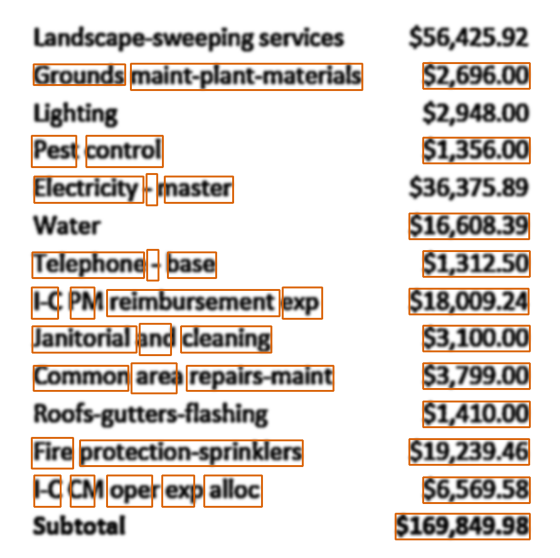

In [22]:
for g, p1 in tes_data_bl.iterrows():
    poly1 = Polygon(p1['poly'])
    overlapped = []
    for h, p2 in tes_data_bl.iterrows():
        if g == h:
            continue
        poly2 = Polygon(p2['poly'])
        if poly1.contains(poly2.centroid):
            overlapped.append(p2['poly'])
    if overlapped:
        leftmost_x0 = min([x[0][0] for x in overlapped])
        tes_data_bl.loc[g]['poly'][1] = (leftmost_x0 - 5,
                                         tes_data_bl.loc[g]['poly'][1][1])
        tes_data_bl.loc[g]['poly'][2] = (leftmost_x0 - 5,
                                         tes_data_bl.loc[g]['poly'][2][1])

plt.figure(figsize=(10, 10))
plt.axis('off')
plt.imshow(demo1.draw_rects(tes_data_bl, blurred_bytes, (217, 95, 2)))

### Google Vision: splits what you might expect to be joined

As opposed to Tesseract, Google Vision provides far more fragmented bounding boxes for recognised text entities. Note, how helpfully and implicitly it separates chars being read as punctuation maks from the preceding words. But this might be considered as undesirable behaviour in some contexts! In our particular case taking out a monetary unit from the bounding box of the subsequent number make it difficult to directly compare OCR engines performance in terms of chars quantity.

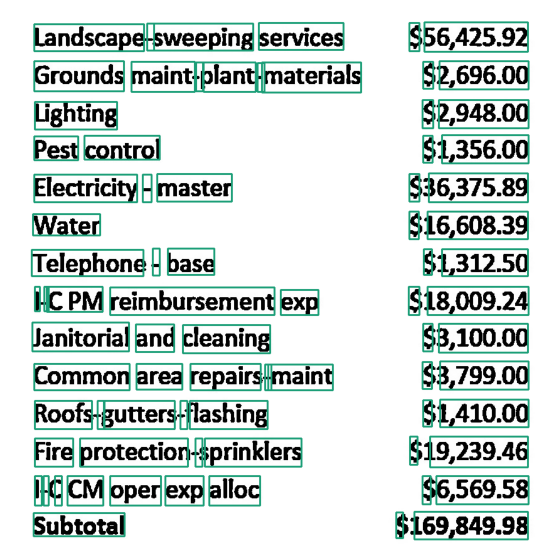

In [28]:
ggl_data = demo1.get_ggl_ocr_data(img_bytes)

plt.figure(figsize=(10, 10))
plt.axis('off')
plt.imshow(demo1.draw_rects(ggl_data, img_bytes, (27, 158, 119)))

### Method for OCR comparison: finer points

It follows from above that in our comparison we should take into consideration not only the number of chars recognised at each step of filters’ applying but as well their proper places, i.e. bounding boxes determined on the initial step.  As we have significantly different outputs from OCR engines we need to manually correct bounding boxes, this time via merging all overlapping polygons in the following way:

In [29]:
tes_data = demo1.get_tes_ocr_data(img_bytes)
ggl_data_orig, tes_data_orig = ggl_data.copy(), tes_data.copy()

In [30]:
SHOULD_RESTART = True
while SHOULD_RESTART:
    SHOULD_RESTART = False
    for i, trow in tes_data.iterrows():
        for j, grow in ggl_data.iterrows():
            tpoly = Polygon(trow['poly'])
            gpoly = Polygon(grow['poly'])
            if (demo1.has_intersection(tpoly, gpoly) and
                    not tpoly.equals(gpoly)):
                points = np.array(trow['poly'] + grow['poly'])
                min_x, min_y, max_x, max_y = demo1.get_bbox_values(points)
                bbox = [(min_x, min_y),
                        (max_x, min_y),
                        (max_x, max_y),
                        (min_x, max_y)]
                tes_data.at[i, 'poly'] = bbox
                ggl_data.at[j, 'poly'] = bbox
                SHOULD_RESTART = True
                break

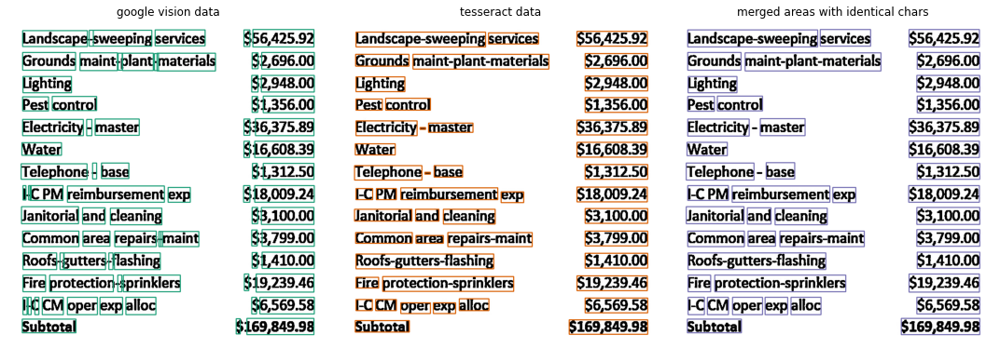

In [32]:
collated = demo1.collate_data(ggl_data, tes_data, col_poly='poly')

baseline = collated.apply(demo1.compare_text, axis=1)
baseline = baseline[(baseline['res'] == 'matched') &
                    (baseline['text_g'].str.len() >= 2)]
baseline['init_scale'] = baseline.apply(demo1.get_scale_ratio, axis=1)

fig, ax = plt.subplots(1, 3, figsize=(15, 10))
titles = ['google vision data',
          'tesseract data',
          'merged areas with identical chars']
ocr_data = [ggl_data_orig, tes_data_orig, baseline]
for i in range(3):
    view = demo1.draw_rects(ocr_data[i], img_bytes, demo1.rgb_colors[i])
    ax[i].axis("off")
    ax[i].set_adjustable("box")
    ax[i].title.set_text(titles[i])
    ax[i].imshow(view)
fig.tight_layout()

Onwards we will count the number of recognised chars precisely within these baseline borders. For illustrative purposes, the number of properly read chars will be shown over the corresponding area on the image with as an opaque colourful horizontal bar. The shorter those stacked bars are the less number of chars were successfully read within the given block by the corresponding OCR engine.

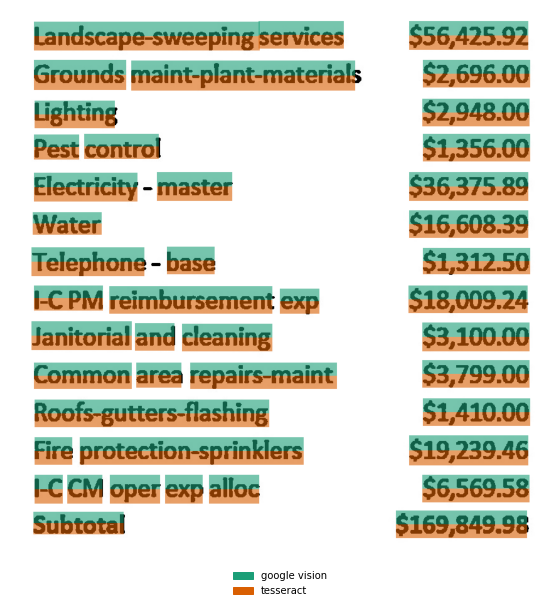

In [34]:
initial_bars = demo1.draw_stacked_bars(baseline,
                                       img_bytes,
                                       col_poly='poly')

ggl_legend = mpatches.Patch(color=hex_colors[0], label='google vision')
tes_legend = mpatches.Patch(color=hex_colors[1], label='tesseract')

plt.figure(figsize=(10, 10))
plt.axis('off')
plt.imshow(initial_bars)
plt.legend(bbox_to_anchor=(0.5, -0.1),
           loc='lower center',
           handles=[ggl_legend, tes_legend],
           frameon=False)

## Putting it all together

By comparing the OCR results of both tools on each step of applying degrading filters to the original image we hopefully will get a sense of their specific features. Here is an example of an intermediary step and its OCR results:

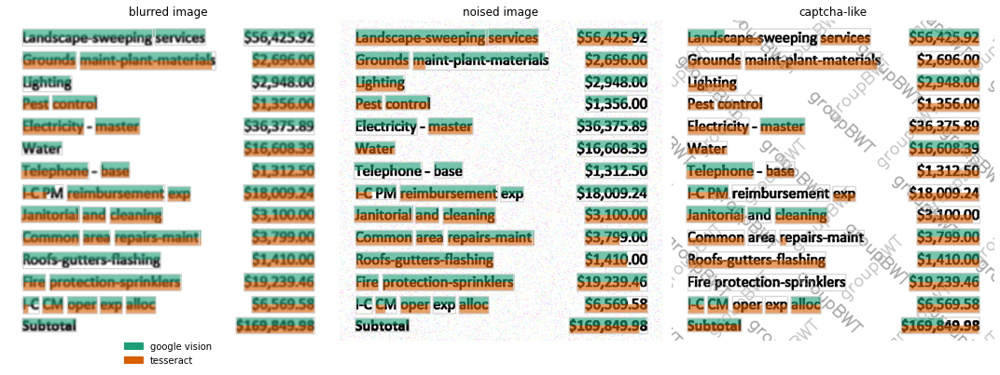

In [35]:
noised = demo1.add_gaussian_noise(img_bytes, 0.23)
noised_bytes = cv2.imencode('.png', noised)[1].tobytes()

captcha = demo1.put_watermark(img_bytes, (180, 180, 180, 255))
captcha_bytes = cv2.imencode('.png', captcha)[1].tobytes()

fig, ax = plt.subplots(1, 3, figsize=(15, 10))
titles = ['blurred image',
          'noised image',
          'captcha-like']
view_bytes = [blurred_bytes, noised_bytes, captcha_bytes]
for i in range(3):
    iter_data = demo1.get_iter_data(view_bytes[i])
    iter_bars = demo1.draw_stacked_bars(iter_data,
                                        view_bytes[i],
                                        col_poly='poly_base')
    iter_bars_bytes = cv2.imencode('.png', iter_bars)[1].tobytes()
    iter_view = demo1.draw_rects(baseline, iter_bars_bytes, rgb_colors[2])
    ax[i].axis("off")
    ax[i].set_adjustable("box")
    ax[i].title.set_text(titles[i])
    ax[i].imshow(iter_view)
    if i == 0:
        ax[i].legend(bbox_to_anchor=(0.5, -0.1),
                     loc='lower center',
                     handles=[ggl_legend, tes_legend],
                     frameon=False)
fig.tight_layout()

Теперь, когла мы разобрались с особенностями методики сравнения, мы можем увидеть, как работает наш подхолд в динамике: 

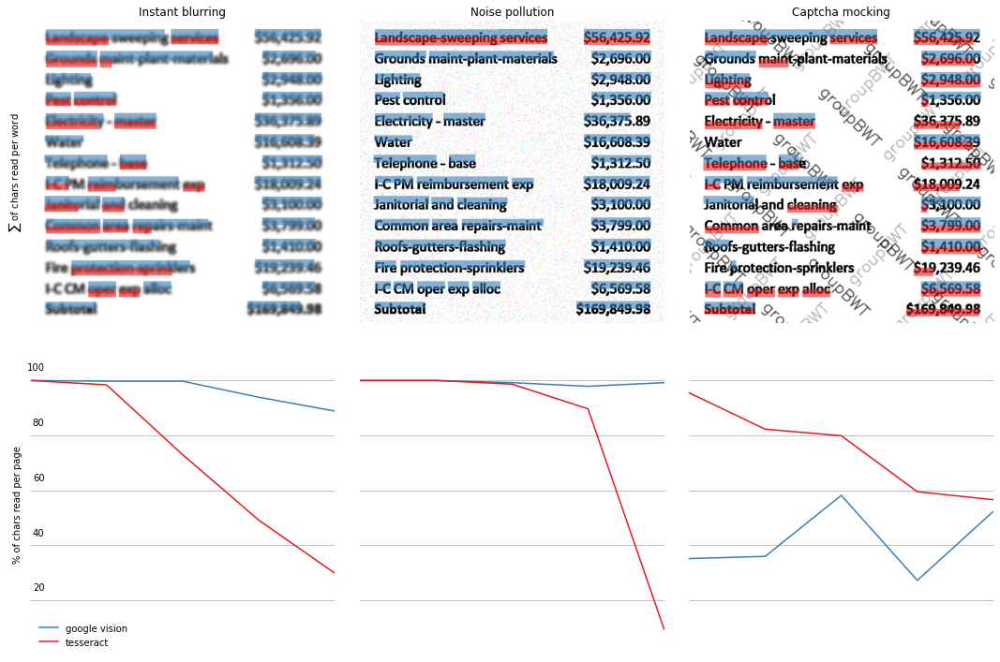

In [15]:
demo1.make_animation()

И еще на одном примере:

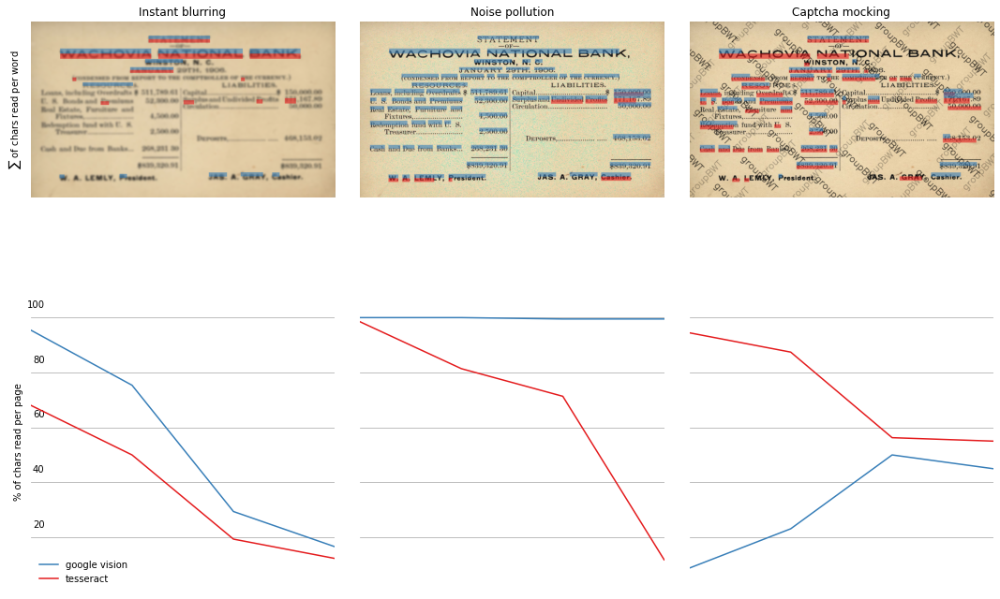

In [18]:
FILE = 'example_ready/Wachovia_National_Bank_1906_statement.jpg'
with open(FILE, 'rb') as img_obj:
    img_bytes = img_obj.read()    
demo2 = DemoOCR('credentials/test3.json', img_bytes)
demo3.make_animation()

In [27]:
HTML(demo1.make_animation().to_jshtml())

## Выводы

Оба движка учспешно применяются в бизнес-проектах. Похоже, что Тессеракт более чувствителен к качеству входящих изображений и требует их более тщатиельной предварительной оббработке. Оба движка плохо распознают текст с подложкой. Но основной недостаток Гугл Вижн - органиченные условия для бесплатного использования. Тем не менее, в зависимости от требований и бюджета проекта можно подобрать и настроить любой из двух предстваленных в обзоре инструментов.